In [126]:
import json
import re
import ssl

import certifi
#import geopy
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
#from geopy import Nominatim


In [127]:
# to potrzebne, bo inaczej wyskakuje GeocoderServiceError, ale ogólnie bardzo niewskazane XD
ssl._create_default_https_context = ssl._create_unverified_context

In [128]:
pos = json.load(open("station_pos_new.json","r", encoding="utf-8"))

In [129]:
pos["Łąg"] = [18.065844820300693, 53.831195018983074]
pos["Radomyśl"] = [ 22.381036085411196, 52.03110791812052]
pos["Jagodin"] = [23.895798884090656,  51.19818428908686]
pos["Jarosław"] = [22.677651659198048, 50.011096189470834]
pos["Chałupki"] = [18.311526302001212, 49.925748636690045]
pos["Kostrzyn"] = [14.647305794898253, 52.591351788760555]
pos["Szymbory"] = [22.606110248164722, 52.892801119465815]
pos["Podlasek"] = [ 22.537653809615307, 53.55808435389103]

In [130]:
p = pd.read_csv("data/connections_test2.csv",encoding="utf-8-sig")
len(p)

71228

In [131]:
print(len(p[['stacja_wyjazdu','stacja_przyjazdu']]))
print(len(p[['stacja_wyjazdu','stacja_przyjazdu']].drop_duplicates()))
unique_connections = p[['stacja_wyjazdu','stacja_przyjazdu']].drop_duplicates()
unique_connections = [(conn[1],conn[2]) for conn in unique_connections.itertuples()]
unique_connections.sort()

71228
1140


In [132]:
unique_connections

[('Aleksandrów\xa0Kujawski', 'Toruń\xa0Główny'),
 ('Aleksandrów\xa0Kujawski', 'Włocławek'),
 ('Augustów', 'Dąbrowa\xa0Białostocka'),
 ('Augustów', 'Suwałki'),
 ('Babiak', 'Kutno'),
 ('Babiak', 'Piotrków\xa0Kujawski'),
 ('Babimost', 'Sulechów'),
 ('Babimost', 'Zbąszynek'),
 ('Baciuty', 'Niewodnica'),
 ('Baciuty', 'Trypucie'),
 ('Baciuty', 'Łapy'),
 ('Barczewo', 'Korsze'),
 ('Barczewo', 'Olsztyn\xa0Główny'),
 ('Bardo\xa0Śląskie', 'Kamieniec\xa0Ząbkowicki'),
 ('Bardo\xa0Śląskie', 'Kłodzko\xa0Główne'),
 ('Biała\xa0Piska', 'Ełk'),
 ('Biała\xa0Piska', 'Pisz'),
 ('Biała\xa0Podlaska', 'Chotyłów'),
 ('Biała\xa0Podlaska', 'Międzyrzec\xa0Podlaski'),
 ('Biała\xa0Podlaska', 'Terespol'),
 ('Białogard', 'Koszalin'),
 ('Białogard', 'Kołobrzeg'),
 ('Białogard', 'Szczecinek'),
 ('Białogard', 'Świdwin'),
 ('Białystok', 'Białystok\xa0Starosielce'),
 ('Białystok', 'Bielsk\xa0Podlaski'),
 ('Białystok', 'Niewodnica'),
 ('Białystok', 'Sokółka'),
 ('Białystok', 'Łapy'),
 ('Białystok\xa0Starosielce', 'Białystok

In [133]:
test_trains = p["nazwa_pociagu"].unique()
len(test_trains)

394

ECE 14000/1 SILESIA
[('Warszawa\xa0Wschodnia', 'Warszawa\xa0Centralna'), ('Warszawa\xa0Centralna', 'Warszawa\xa0Zachodnia'), ('Warszawa\xa0Zachodnia', 'Grodzisk\xa0Mazowiecki'), ('Grodzisk\xa0Mazowiecki', 'Opoczno\xa0Południe'), ('Opoczno\xa0Południe', 'Włoszczowa\xa0Północ'), ('Włoszczowa\xa0Północ', 'Zawiercie'), ('Zawiercie', 'Dąbrowa\xa0Górnicza'), ('Dąbrowa\xa0Górnicza', 'Sosnowiec\xa0Główny'), ('Sosnowiec\xa0Główny', 'Katowice'), ('Katowice', 'Tychy'), ('Tychy', 'Rybnik'), ('Rybnik', 'Wodzisław\xa0Śląski'), ('Wodzisław\xa0Śląski', 'Chałupki'), ('Chałupki', 'Bohumin')]
ECE 14002/3 POLONIA
[('Warszawa\xa0Wschodnia', 'Warszawa\xa0Centralna'), ('Warszawa\xa0Centralna', 'Warszawa\xa0Zachodnia'), ('Warszawa\xa0Zachodnia', 'Zawiercie'), ('Zawiercie', 'Sosnowiec\xa0Główny'), ('Sosnowiec\xa0Główny', 'Katowice'), ('Katowice', 'Tychy'), ('Tychy', 'Pszczyna'), ('Pszczyna', 'Zebrzydowice'), ('Zebrzydowice', 'Petrovice\xa0u\xa0Karvine')]
ECE 14004/5 BATORY
[('Terespol', 'Biała\xa0Podlaska'), (

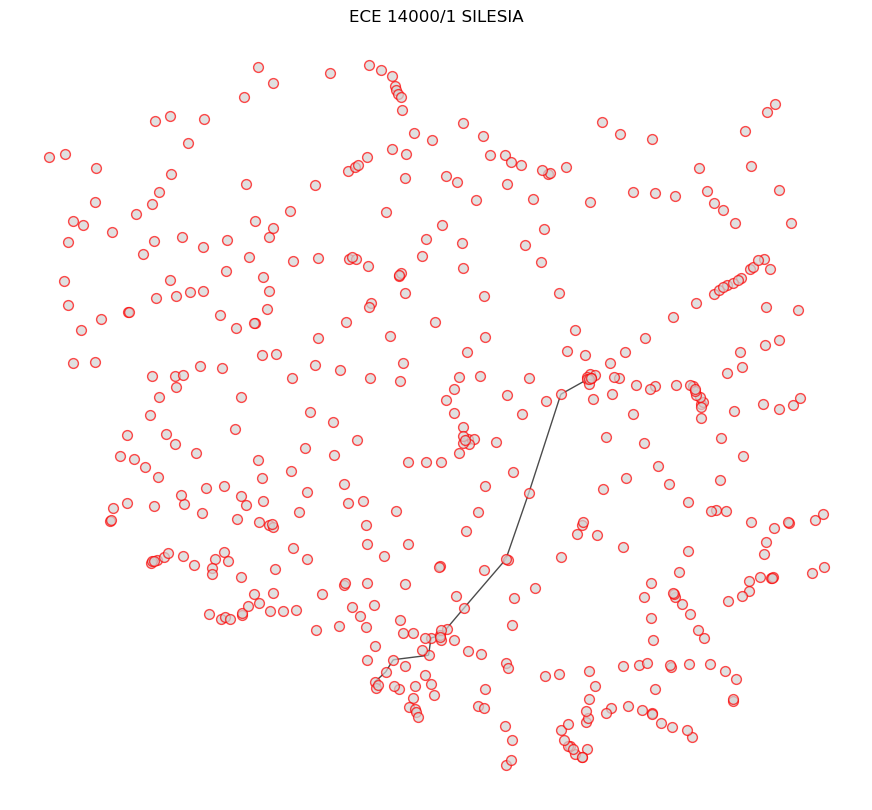

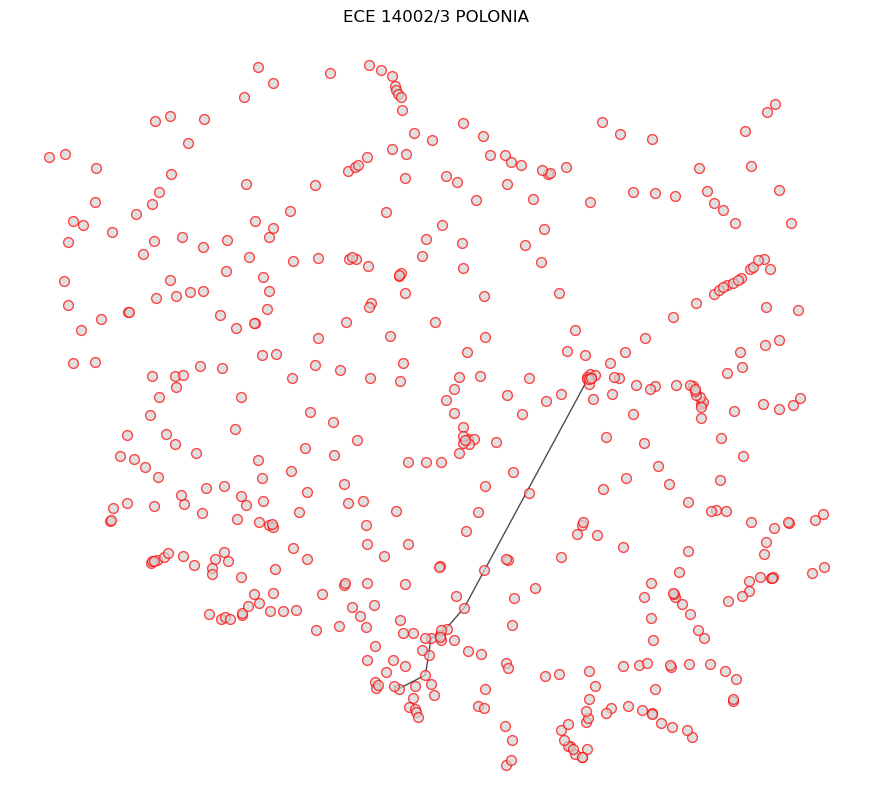

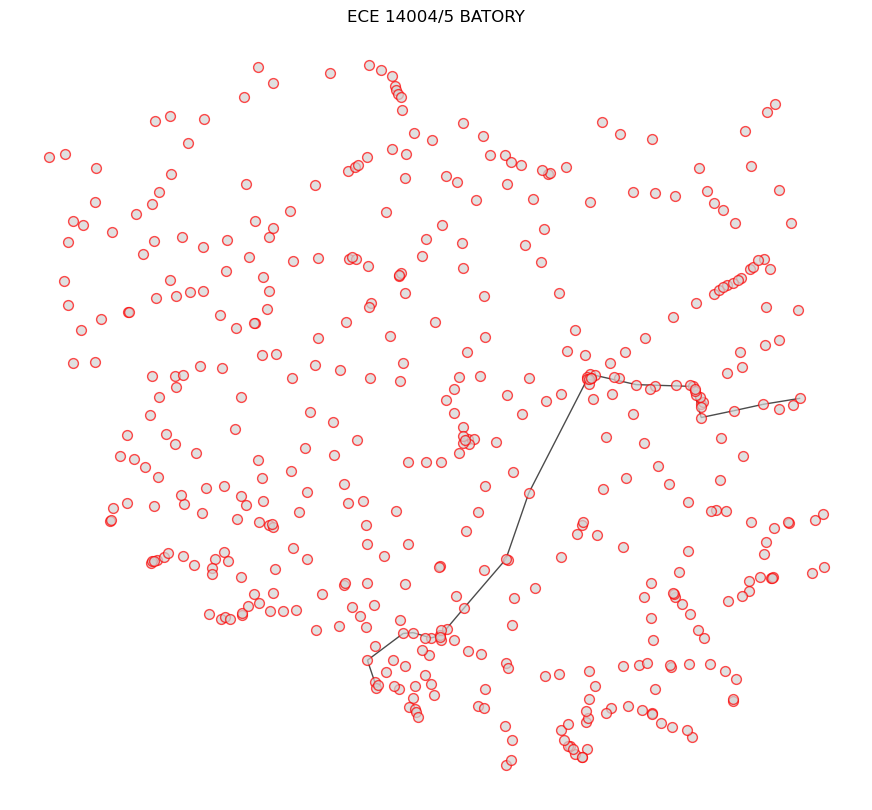

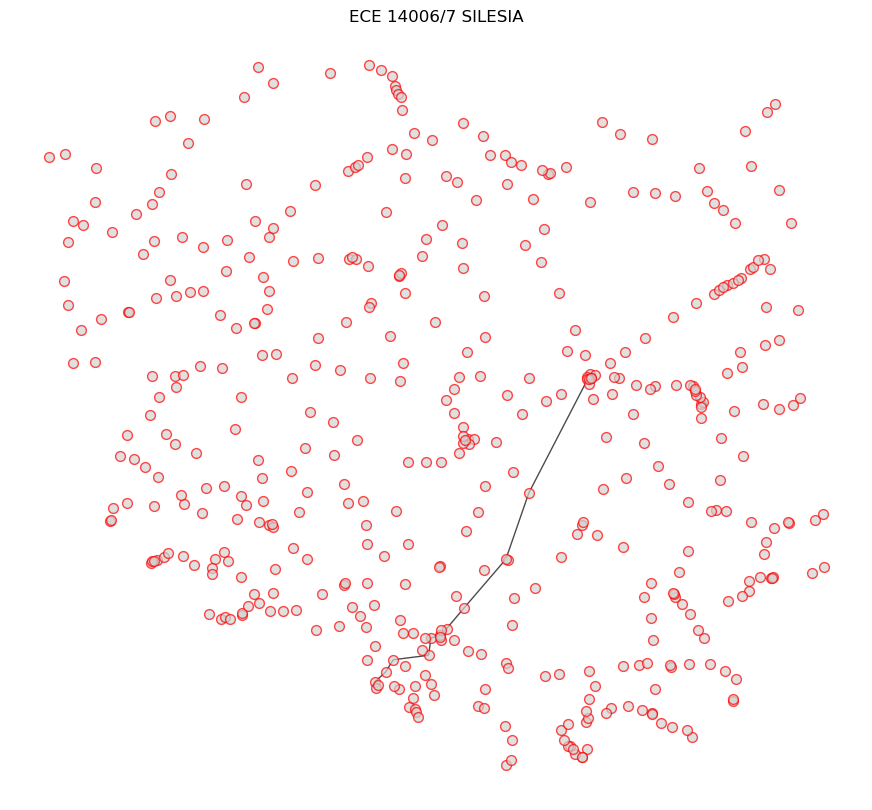

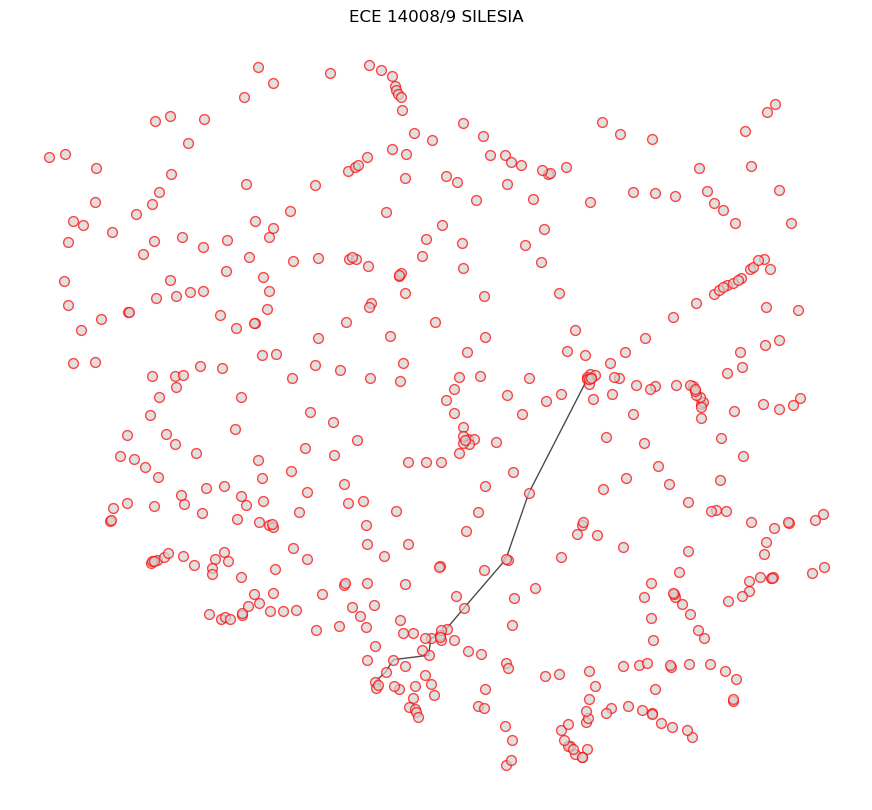

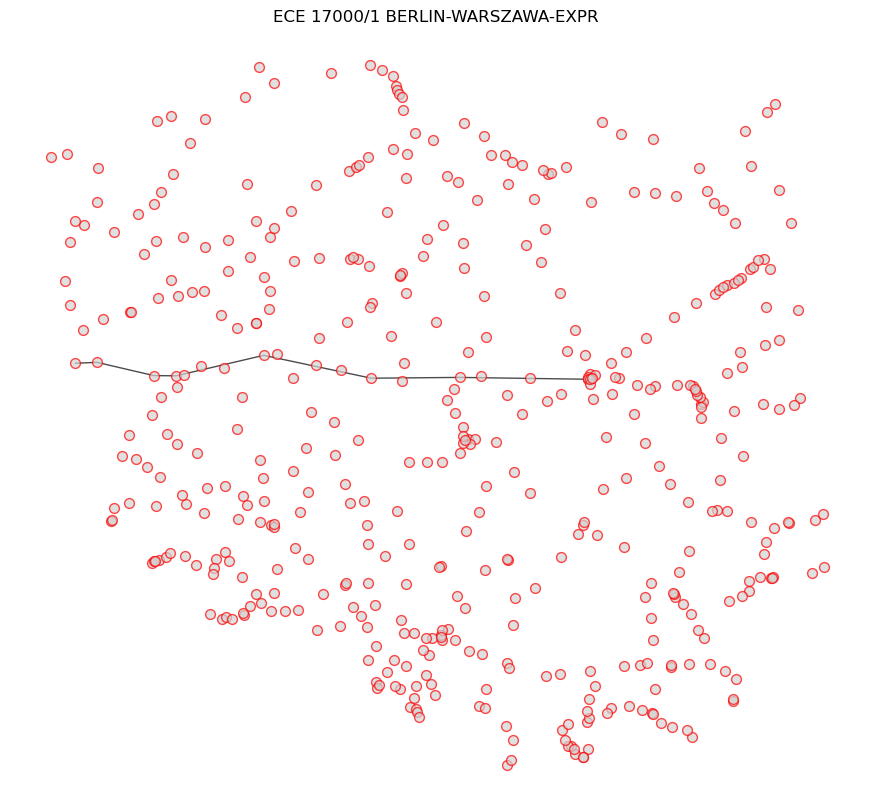

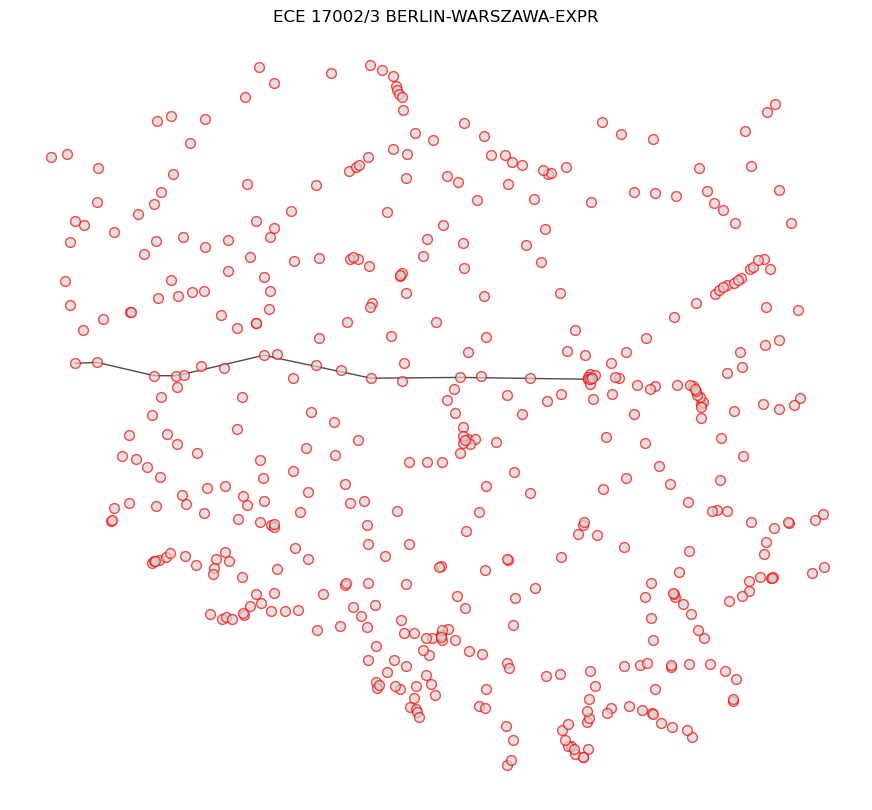

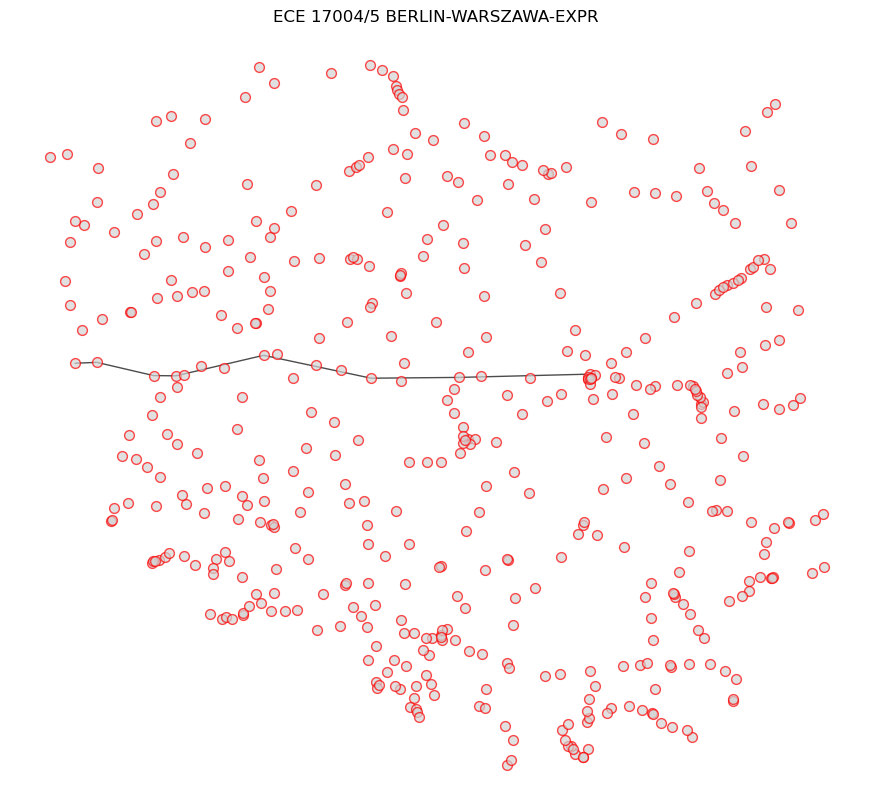

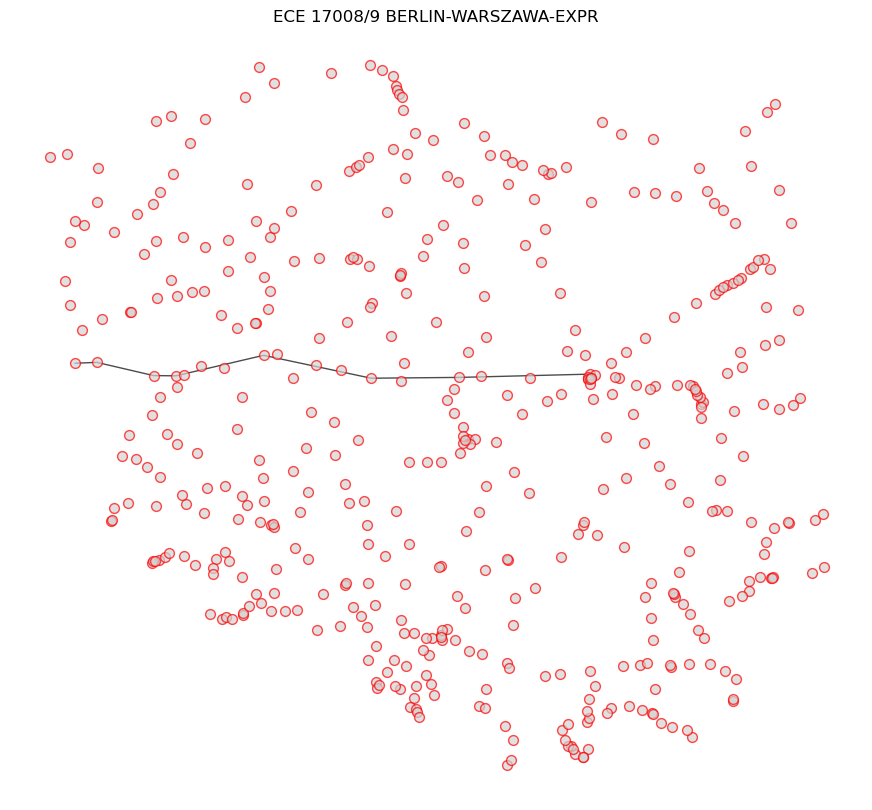

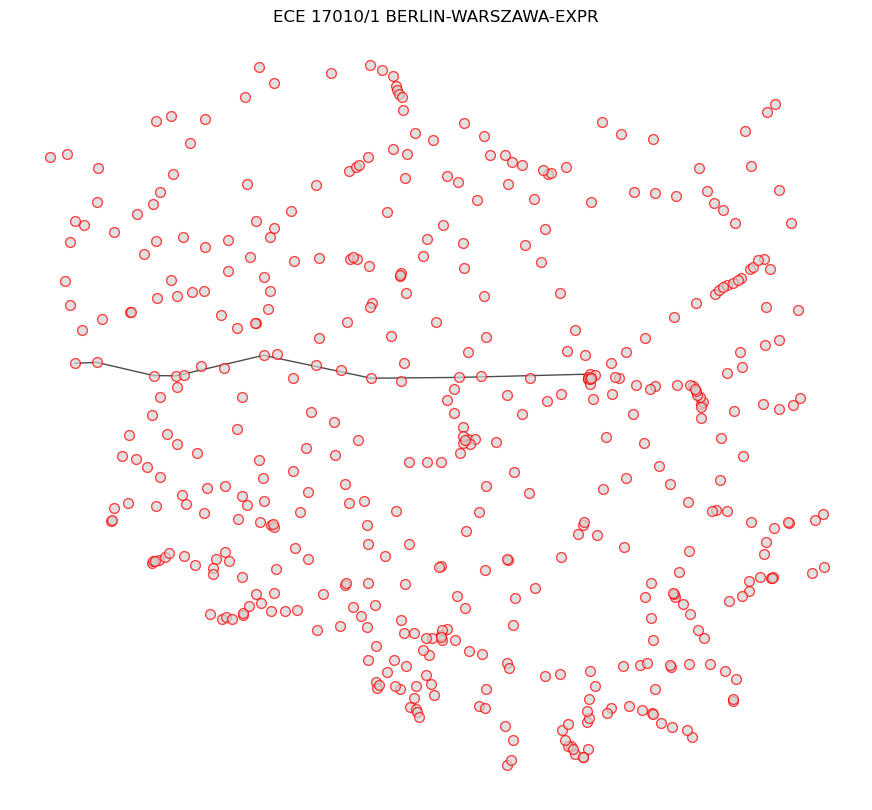

In [134]:
nodes = list(pos.keys())
for train_name in test_trains[:10]:
    plt.figure(figsize=(11,10))
    G = nx.Graph()
    G.add_nodes_from(nodes)
    temp_connections = p.loc[p["nazwa_pociagu"]== train_name][['stacja_wyjazdu','stacja_przyjazdu']].drop_duplicates()
    plt.title(train_name)
    edges = [(conn[1],conn[2]) for conn in temp_connections.itertuples()]
    print(train_name)
    print(edges)
    G.add_edges_from(edges )
    labels = {node: "-".join([w[:2] for w in re.split('\s',node)]) for node in G.nodes()}
    nx.draw(G,pos,node_size=50,alpha=0.7,edgecolors='red', node_color='lightgray' )

In [135]:
p.loc[(p["nazwa_pociagu"]== "MME 13000/1 HAŃCZA")&(p["stacja_wyjazdu"]== 'Kraków\xa0Główny')].drop_duplicates()

,Unnamed: 0,nazwa_pociagu,stacja_wyjazdu,stacja_przyjazdu,data,czas_rozkladowy,opoznienie,opoznienie_netto
32638,17012,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,16.03,16:39,0.0,-3.0
32674,16976,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,17.03,16:39,0.0,-2.0
32710,16940,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,18.03,16:39,0.0,0.0
32746,16904,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,19.03,16:39,0.0,0.0
32782,16868,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,20.03,16:39,1.0,0.0
32818,16832,MME 13000/1 HAŃCZA,Kraków Główny,Sokółka,21.03,16:39,0.0,-26.0


In [136]:

err_conn = [('Lublin\xa0Główny', 'Legnica'), ('Warszawa\xa0Gdańska', 'Łódź\xa0Widzew'),  ('Kraków\xa0Główny', 'Sokółka') ,  ('Świnoujście', 'Białystok'),  ('Poznań\xa0Główny', 'Łódź\xa0Widzew'), ('Zielona\xa0Góra\xa0Główna', 'Lublin\xa0Główny') ]

for conn in err_conn:
    print("try to delete" + conn[0] + conn[1])
    try:
        unique_connections.remove(conn)
    except:
        pass

#testowa zmiana s

try to deleteLublin GłównyLegnica
try to deleteWarszawa GdańskaŁódź Widzew
try to deleteKraków GłównySokółka
try to deleteŚwinoujścieBiałystok
try to deletePoznań GłównyŁódź Widzew
try to deleteZielona Góra GłównaLublin Główny


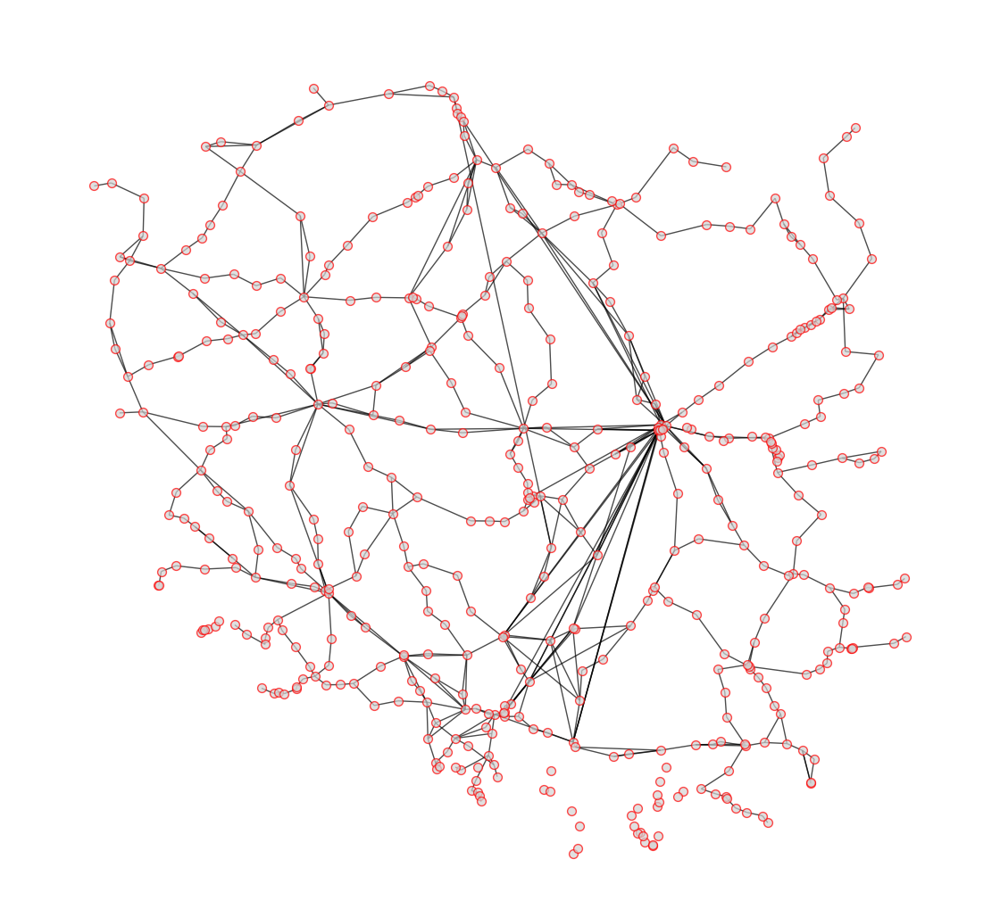

In [137]:
plt.figure(figsize=(11,10))
G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from( unique_connections)
labels = {node: "-".join([w[:2] for w in re.split('\s',node)]) for node in G.nodes()}
nx.draw(G,pos,node_size=50,alpha=0.7,edgecolors='red', node_color='lightgray')

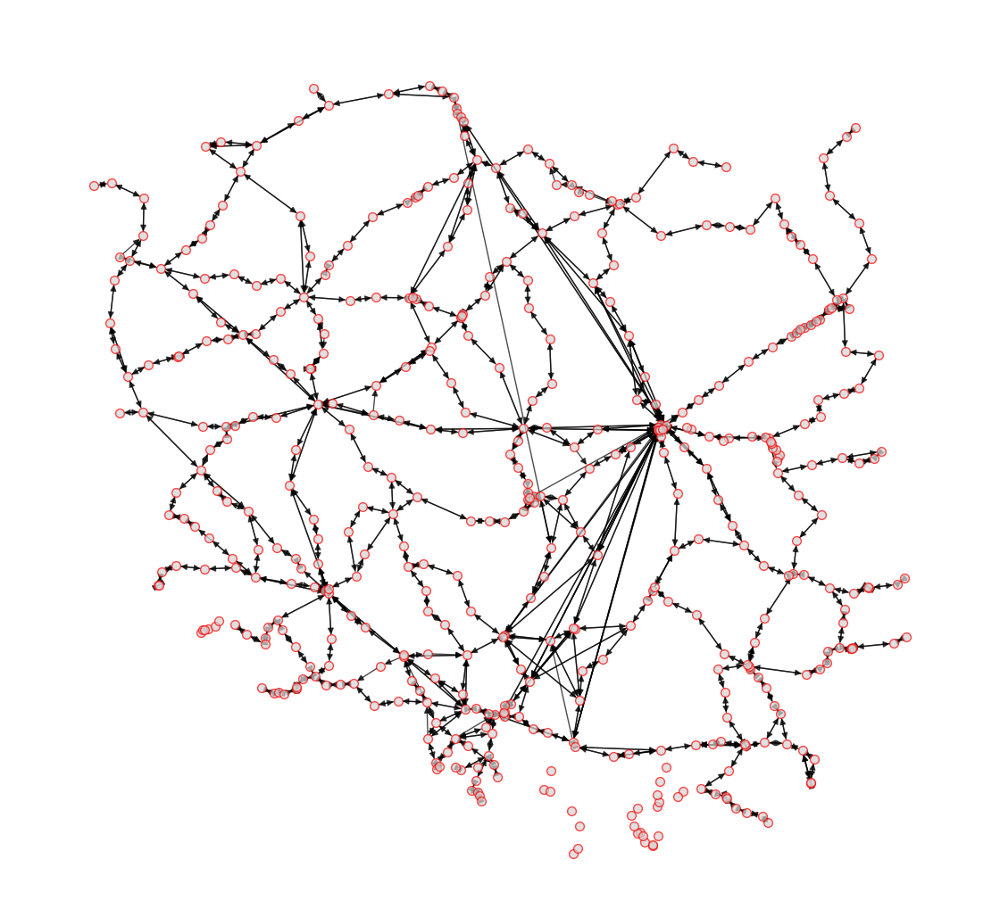

In [138]:
plt.figure(figsize=(11,10))
G = nx.DiGraph()
#edges = [(conn[1],conn[2]) for conn in unique_connections.itertuples()]
G.add_nodes_from(nodes)
G.add_edges_from(unique_connections)
labels = {node: "-".join([w[:2] for w in re.split('\s',node)]) for node in G.nodes()}
nx.draw(G,pos,node_size=50,alpha=0.7,edgecolors='red', node_color='lightgray', arrows = True)

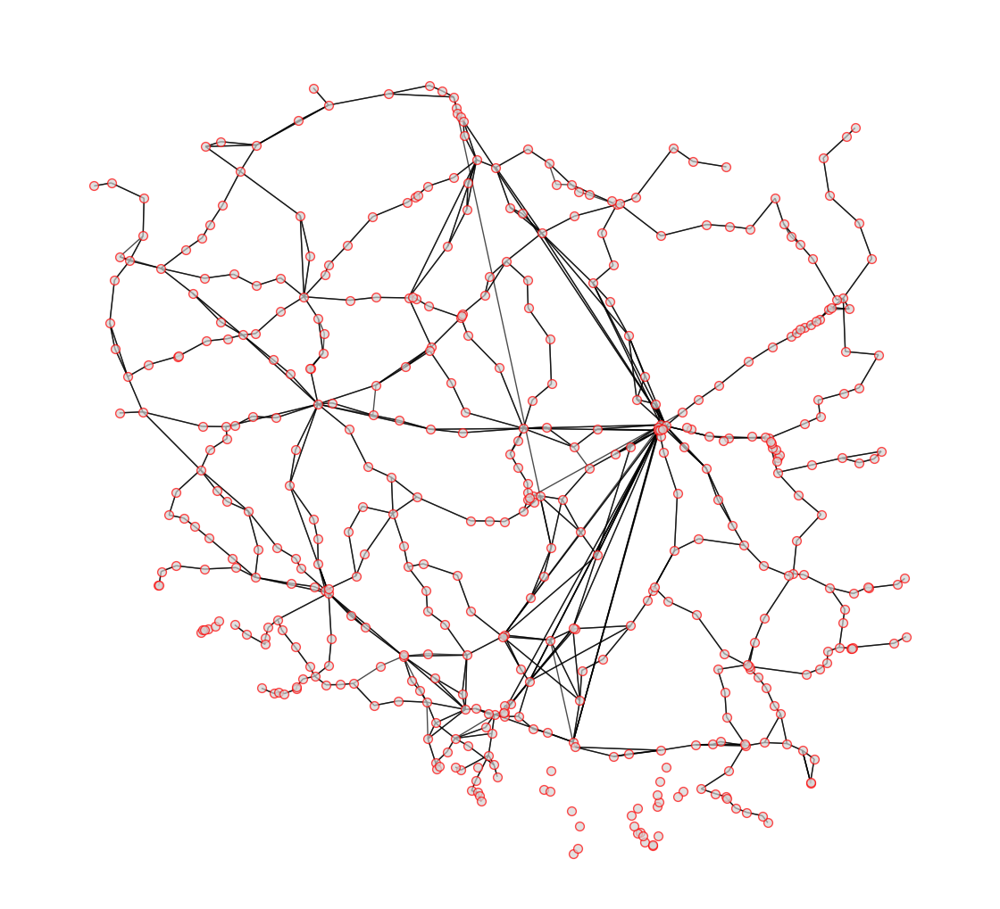

In [139]:
plt.figure(figsize=(11,10))
G = nx.DiGraph()
#edges = [(conn[1],conn[2]) for conn in unique_connections.itertuples()]
G.add_nodes_from(nodes)
G.add_edges_from(unique_connections)
labels = {node: "-".join([w[:2] for w in re.split('\s',node)]) for node in G.nodes()}
nx.draw(G,pos,node_size=50,alpha=0.7,edgecolors='red', node_color='lightgray', arrows = False)

## One-way connections

In [140]:
one_way_connections = [(s1, s2) for (s1, s2) in unique_connections if (s2, s1) not in unique_connections]

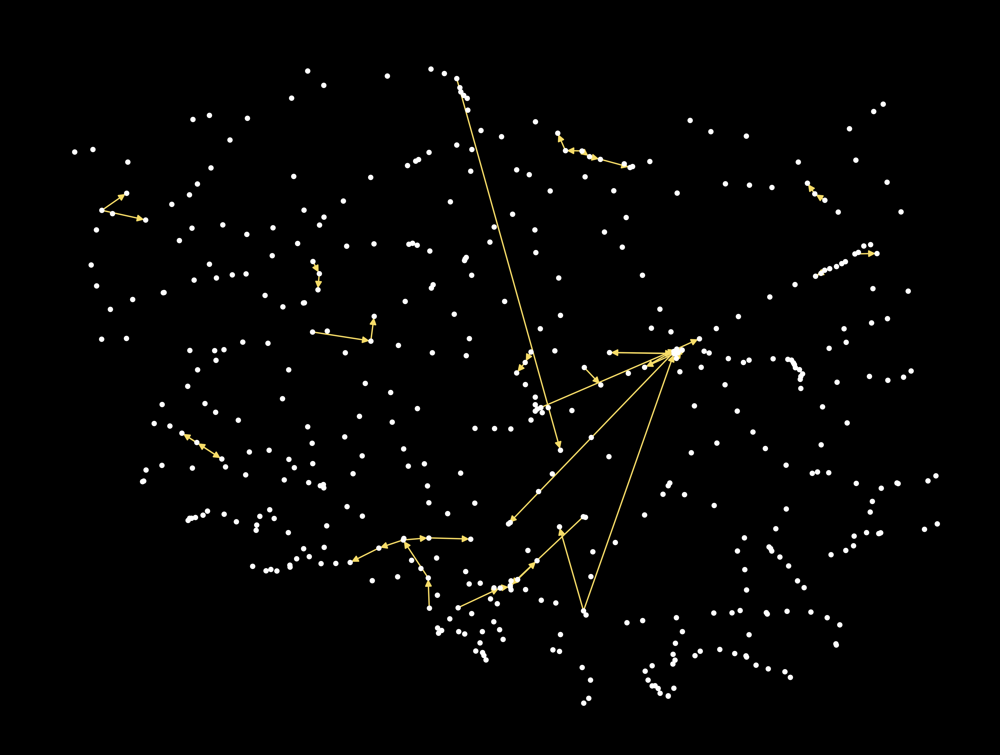

In [141]:
fig, ax = plt.subplots(dpi = 1000)
G2 = nx.DiGraph()
G2.add_nodes_from(nodes)
G2.add_edges_from(one_way_connections)
nx.draw(
    G2,
    pos,
    node_size = 1,
    alpha = 1,
    arrows = True,
    arrowsize = 5,
    edge_color = "#f6dc68",
    node_color = "white",
    width = 0.5
)

fig.set_facecolor("black")


## Mean delay

In [142]:
mean_delays = p[["stacja_wyjazdu", "stacja_przyjazdu", "opoznienie"]] \
    .groupby(["stacja_wyjazdu", "stacja_przyjazdu"]) \
    .mean()
mean_delays

opoznienie
stacja_wyjazdu       stacja_przyjazdu                      
Aleksandrów Kujawski Toruń Główny                 12.621849
                     Włocławek                     3.401515
Augustów             Dąbrowa Białostocka           0.000000
                     Suwałki                      16.583333
Babiak               Kutno                         6.000000
...                                                     ...
Żyrardów             Grodzisk Mazowiecki           5.052632
                     Skierniewice                  9.192053
                     Warszawa Gdańska              5.709184
                     Warszawa Zachodnia           10.057377
                     Warszawa Zachodnia peron 9    8.764706

[1140 rows x 1 columns]

In [143]:
for u, v, d in G.edges(data = True):
    d["weight"] = mean_delays.loc[(u, v), "opoznienie"]
edges, weights = zip(*nx.get_edge_attributes(G, "weight").items())

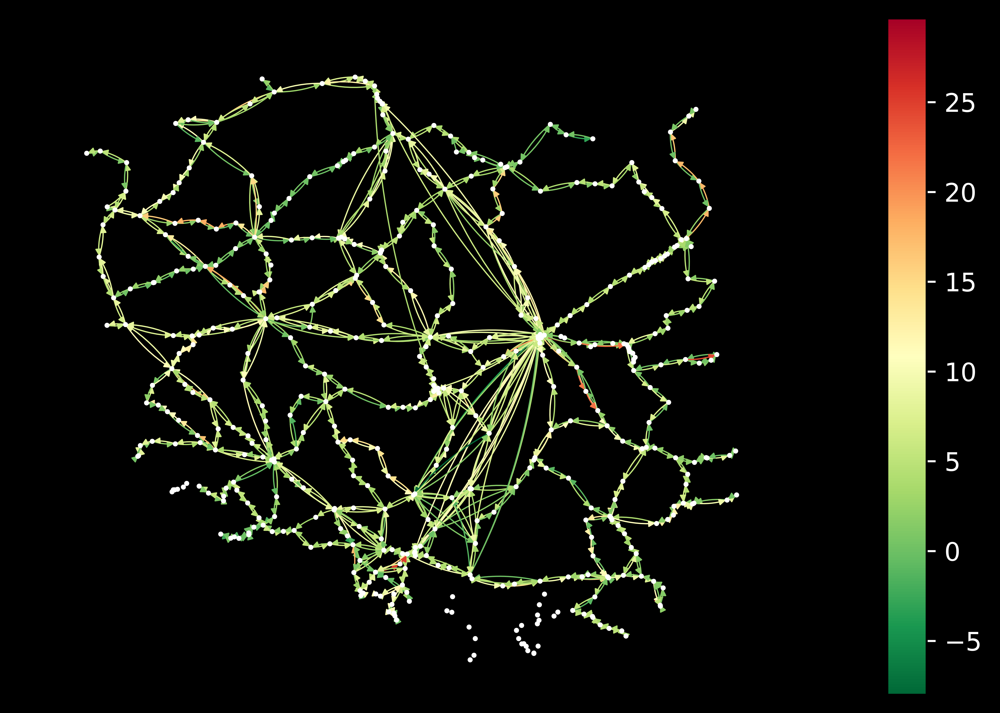

In [144]:
fig, (ax, cax) = plt.subplots(ncols = 2, dpi = 1000, gridspec_kw = {"width_ratios":[1, 0.05]})

nx.draw(
    G, 
    pos,
    ax = ax, 
    node_size = 1, 
    node_color = "white",
    alpha = 1,
    edgelist = edges, 
    edge_color = weights, 
    edge_cmap = plt.cm.RdYlGn_r,
    arrows = True,
    arrowsize = 5,
    connectionstyle = 'arc3, rad = 0.1',
    width = 0.5
)

fig.set_facecolor("black")

sm = plt.cm.ScalarMappable(cmap = plt.cm.RdYlGn_r, norm = plt.Normalize(vmin = min(weights), vmax = max(weights)))
sm.set_array([])
cax.tick_params(axis = 'x', colors = 'white')    
cax.tick_params(axis = 'y', colors = 'white') 
cbar = plt.colorbar(sm, cax = cax)

## Mean delay netto

In [145]:
mean_delays_netto = p[["stacja_wyjazdu", "stacja_przyjazdu", "opoznienie_netto"]] \
    .groupby(["stacja_wyjazdu", "stacja_przyjazdu"]) \
    .mean()
mean_delays_netto

opoznienie_netto
stacja_wyjazdu       stacja_przyjazdu                            
Aleksandrów Kujawski Toruń Główny                       -0.117647
                     Włocławek                           0.128788
Augustów             Dąbrowa Białostocka                 0.000000
                     Suwałki                            -0.916667
Babiak               Kutno                              -8.250000
...                                                           ...
Żyrardów             Grodzisk Mazowiecki                -1.000000
                     Skierniewice                        1.678808
                     Warszawa Gdańska                    1.229592
                     Warszawa Zachodnia                  3.098361
                     Warszawa Zachodnia peron 9          6.029412

[1140 rows x 1 columns]

In [146]:
for u, v, d in G.edges(data = True):
    d["weight"] = mean_delays_netto.loc[(u, v), "opoznienie_netto"]
edges, weights = zip(*nx.get_edge_attributes(G, "weight").items())

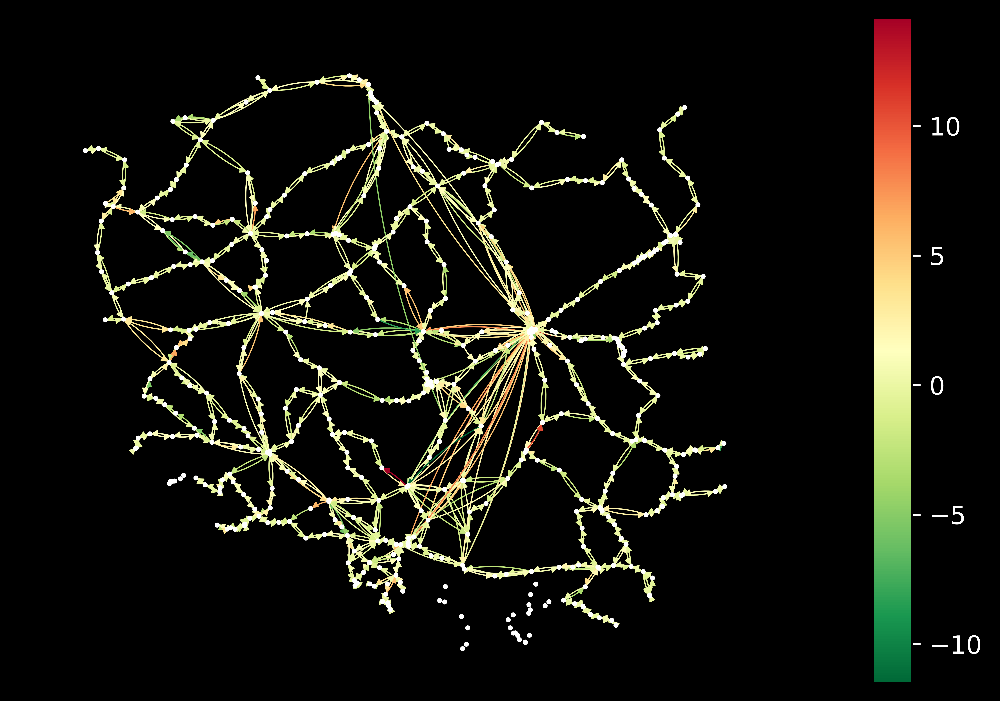

In [147]:
fig, (ax, cax) = plt.subplots(ncols = 2, dpi = 1000, gridspec_kw = {"width_ratios":[1, 0.05]})

nx.draw(
    G, 
    pos,
    ax = ax, 
    node_size = 1, 
    node_color = "white",
    alpha = 1,
    edgelist = edges, 
    edge_color = weights, 
    edge_cmap = plt.cm.RdYlGn_r,
    arrows = True,
    arrowsize = 5,
    connectionstyle = "arc3, rad = 0.1",
    width = 0.5
)

fig.set_facecolor("black")

sm = plt.cm.ScalarMappable(cmap = plt.cm.RdYlGn_r, norm = plt.Normalize(vmin = min(weights), vmax = max(weights)))
sm.set_array([])  
cax.tick_params(axis = 'y', colors = "white") 
cbar = plt.colorbar(sm, cax = cax)

 

In [148]:
mean_delays_netto[mean_delays_netto.opoznienie_netto > 10]

,,opoznienie_netto
stacja_wyjazdu,stacja_przyjazdu,
Częstochowa Stradom,Krzepice,14.166667
Skarżysko Kościelne,Radom Główny,10.625000
Warszawa Gdańska,Mińsk Mazowiecki,11.000000


In [149]:
mean_delays_netto.loc[[("Krzepice", "Częstochowa\xa0Stradom"),
                       ("Radom\xa0Główny", "Skarżysko\xa0Kościelne"),
                       ("Mińsk\xa0Mazowiecki", "Warszawa\xa0Gdańska")]]

,,opoznienie_netto
stacja_wyjazdu,stacja_przyjazdu,
Krzepice,Częstochowa Stradom,2.833333
Radom Główny,Skarżysko Kościelne,2.083333
Mińsk Mazowiecki,Warszawa Gdańska,2.083333


In [150]:
mean_delays_netto[mean_delays_netto.opoznienie_netto < -7]

,,opoznienie_netto
stacja_wyjazdu,stacja_przyjazdu,
Babiak,Kutno,-8.250000
Dorohusk,Jagodin,-7.916667
Lublin Główny,Legnica,-14.500000
Opoczno Południe,Częstochowa Stradom,-11.500000


In [151]:
("Lublin\xa0Główny", "Legnica") in one_way_connections

False

In [152]:
mean_delays_netto.loc[[("Kutno", "Babiak"),
                       ("Częstochowa\xa0Stradom", "Opoczno\xa0Południe")]]

,,opoznienie_netto
stacja_wyjazdu,stacja_przyjazdu,
Kutno,Babiak,-3.166667
Częstochowa Stradom,Opoczno Południe,2.500000


## Mean delay per station

In [153]:
df = pd.read_csv("data/data_updated.csv", na_values = "--")
mean_delays_nodes = df[["stacja_pomiaru", "opoznienie"]] \
    .groupby("stacja_pomiaru") \
    .mean("opoznienie")
mean_delays_nodes

C:\Users\klaud\AppData\Local\Temp\ipykernel_18184\118598682.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/data_updated.csv", na_values = "--")


,opoznienie
stacja_pomiaru,
Aleksandrów Kujawski,6.281657
Augustów,9.555556
Babiak,5.844156
Babimost,7.028846
Baciuty,6.321429
...,...
Żegiestów-Zdrój,1.810526
Żmigród,3.758037
Żory,2.761589


In [154]:
for u, d in G.nodes(data = True):
    d["weight"] = mean_delays_nodes.loc[u, "opoznienie"]
nodes, weights = zip(*nx.get_node_attributes(G, "weight").items())

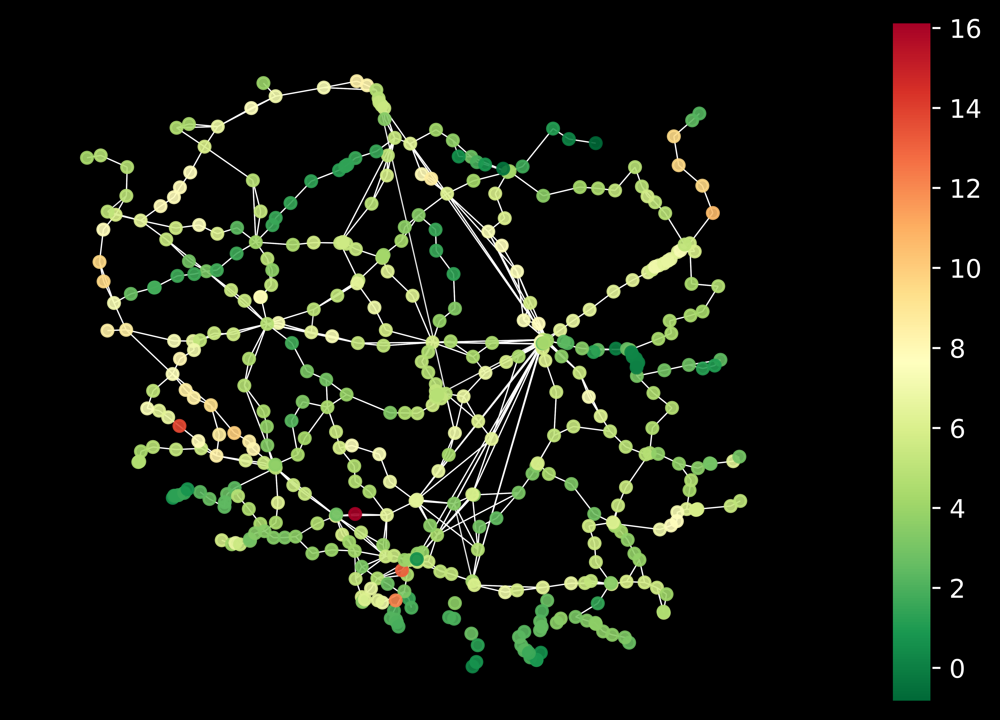

In [155]:
fig, (ax, cax) = plt.subplots(ncols = 2, dpi = 1000, gridspec_kw = {"width_ratios":[1, 0.05]})

nx.draw(
    G, 
    pos,
    ax = ax, 
    node_size = 20, 
    node_color = weights,
    cmap = plt.cm.RdYlGn_r,
    alpha = 0.9,
    edgelist = edges,
    edge_color = "white",
    arrows = False,
    width = 0.5
)

fig.set_facecolor("black")

sm = plt.cm.ScalarMappable(cmap = plt.cm.RdYlGn_r, norm = plt.Normalize(vmin = min(weights), vmax = max(weights)))
sm.set_array([])   
cax.tick_params(axis = 'y', colors = 'white') 
cbar = plt.colorbar(sm, cax = cax)

In [156]:
mean_delays_nodes[mean_delays_nodes.opoznienie > 10]

,opoznienie
stacja_pomiaru,
Chybie,12.090909
Leszno Górne,13.733333
Mikołów,13.152778
Ozimek,16.142857
Sokółka,10.550336


## Average number of trains

In [157]:
mean_train_number = df[["stacja_pomiaru", "czas_przyjazdu"]].groupby("stacja_pomiaru").count() / 118
mean_train_number

,czas_przyjazdu
stacja_pomiaru,
Aleksandrów Kujawski,7.254237
Augustów,1.177966
Babiak,0.652542
Babimost,3.313559
Baciuty,0.949153
...,...
Żegiestów-Zdrój,0.805085
Żmigród,10.025424
Żory,1.279661


In [158]:
for u, d in G.nodes(data = True):
    d["weight"] = mean_train_number.loc[u, "czas_przyjazdu"]
nodes, weights = zip(*nx.get_node_attributes(G, "weight").items())
node_weight = list(nx.get_node_attributes(G, "weight").values())

In [159]:
node_weight = [x * 3 for x in nx.get_node_attributes(G, "weight").values()]

In [160]:
fig, ax = plt.subplots(dpi = 1000, figsize = (11, 10))

nx.draw(
    G, 
    pos,
    ax = ax, 
    node_size = node_weight, 
    node_color = "red",
    edgecolors = "red",
    alpha = 0.5,
    edge_color = "white",
    arrows = False,
    width = 0.5
)

fig.set_facecolor("black")

# sm = plt.cm.ScalarMappable(cmap = plt.cm.RdYlGn_r, norm = plt.Normalize(vmin = min(weights), vmax = max(weights)))
# sm.set_array([])   
# cax.tick_params(axis = 'y', colors = 'white') 
# cbar = plt.colorbar(sm, cax = cax)

In [81]:
import scipy.stats
scipy.stats.spearmanr(mean_train_number, mean_delays_nodes)

SignificanceResult(statistic=0.3509229334904685, pvalue=6.380467370040997e-15)

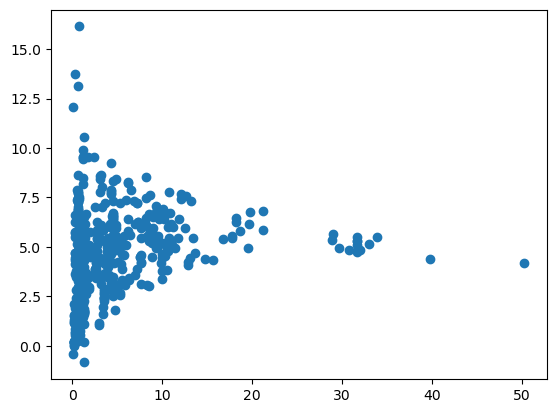

In [82]:
plt.scatter(mean_train_number, mean_delays_nodes)